**Notes**
- https://cloud.google.com/translate/docs/languages
- https://datahub.io/core/language-codes
- http://members.unine.ch/jacques.savoy/clef/ (collection of stopwords in many languages)
- https://www.semantikoz.com/blog/free-stop-word-lists-in-23-languages/

In [98]:
import matplotlib.pyplot as plt
import pandas as pd
import pickle
# import re
import string
import numpy as np

# Preprocessing
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords

# 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [43]:
with open('/Users/jas/ds/data/global_headlines/news-week-24aug17_langs.pkl', 'rb') as f:
    words = pickle.load(f)
    
words.rename(columns={'language':'lang_code'}, inplace=True)
words.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1398431 entries, 0 to 1398430
Data columns (total 5 columns):
publish_time     1398431 non-null int64
feed_code        1398431 non-null object
source_url       1398431 non-null object
headline_text    1397447 non-null object
lang_code        1396962 non-null object
dtypes: int64(1), object(4)
memory usage: 53.3+ MB


In [44]:
# lang_codes = pd.read_csv('https://pkgstore.datahub.io/core/language-codes/language-codes-full_csv/data/b33b6fcda84bcbdea2da1c08587eaa65/language-codes-full_csv.csv')
# lang_codes_map = lang_codes[~lang_codes.alpha2.isnull()][['alpha2', 'English']]
# lang_codes = lang_codes_map
# lang_codes.set_index('alpha2', inplace=True)
# lang_codes_dict = lang_codes.to_dict()
# lang_codes_dict.update({'zh-CH': 'Chinese', 'zh-TW': 'Chinese-Taiwan'})
# with open('Data/lang_codes_dict.pkl', 'wb') as f:
#     pickle.dump(lang_codes_dict, f)
    
with open('Data/lang_codes_dict.pkl', 'rb') as f:
    lang_codes = pickle.load(f)
# lang_codes['English']

# Map the lang_code to the language
words['language'] = words.lang_code.map(lang_codes['English'])
words.head()

,publish_time,feed_code,source_url,headline_text,lang_code,language
0,201708240000,w3-adweek,http://www.adweek.com/digital/facebook-2017-gl...,Here Are the Details on Facebook's Global Part...,en,English
1,201708240000,w3-aktiencheck-de,http://www.aktiencheck.de/news/Artikel-Aktien_...,Aktien New York Schluss: Moderate Verluste nac...,de,German
2,201708240000,w3-aktiencheck-de,http://www.aktiencheck.de/news/Artikel-US_Boer...,US-Börsen im Minus - Zittern vor Notenbankertr...,de,German
3,201708240000,w3-auto-economictimes-indiatimes,http://auto.economictimes.indiatimes.com/news/...,Petrol & diesel on the rise post daily price r...,en,English
4,201708240000,w3-azdailysun,http://azdailysun.com/sports/football/could-de...,Could DeShone Kizer end Browns' history of QB ...,en,English


### How many articles for each language?

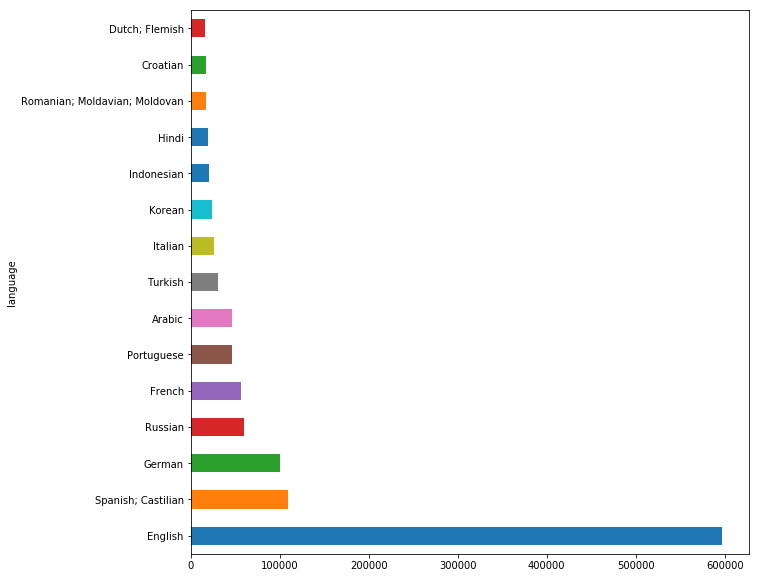

In [80]:
# View summary of top languages used
words_sum = words.groupby('language')['headline_text'].count()
words_sum.sort_values(ascending=False, inplace=True)

# This should be in a horizontal bchart
plt.figure(figsize=(10,10))
words_sum.nlargest(15).plot.barh()
# plt.show();


### Headling Pre-Processing

In [46]:
#Removes front and end punctuation, makes all lower case, removes empty strings.
def clean_news(article):    
    return ' '.join([w.lower().strip().rstrip(string.punctuation)\
        .lstrip(string.punctuation).strip()\
        for w in article.split()\
        if w.strip().rstrip(string.punctuation).strip()])

# function to force to 'None' if error in cleaning on following step
def try_clean(text):
    try:
        w = clean_news(text)
        return(w)
    except:
        return(None)

In [47]:
# clean the headlines
words.dropna(axis=0, how='any', inplace=True)
pre_filter_1 = [try_clean(x) for x in words.headline_text]
    
print('{} total items returned'.format(len(pre_filter_1)))

# return list of indicies with 'None' values (for whatever reason) that we will drop from 'df_news'
drop_inds = [ind for ind, x in enumerate(pre_filter_1) if x is None]
        
# drop from df_news
words = words[~words.index.isin(drop_inds)]
words['prepped_headlines'] = pre_filter_1

words.sample(10)

1364586 total items returned


,publish_time,feed_code,source_url,headline_text,lang_code,language,prepped_headlines
867395,201708281423,w3-connpost,http://www.ctpost.com/news/us/article/Archdioc...,Archdiocese: Donations were misappropriated by...,en,English,archdiocese donations were misappropriated by ...
13067,201708240120,w3-hsbnoticias,http://hsbnoticias.com/noticias/economia/preci...,"Precio del petróleo WTI subió un 1,21 % y cerr...",es,Spanish; Castilian,"precio del petróleo wti subió un 1,21 y cerró ..."
634745,201708270311,w3-dw,http://www.dw.com/en/worlds-biggest-sandcastle...,World's biggest sandcastle attempted in Duisbu...,en,English,world's biggest sandcastle attempted in duisbu...
1339145,201708301430,w3-tribunnews,http://www.tribunnews.com/bisnis/2017/08/30/na...,Navigasi Dua Bandara Khusus Migas Dialihkan,id,Indonesian,navigasi dua bandara khusus migas dialihkan
1120822,201708291558,w3-elbashayeronline,http://elbashayeronline.com/news-874877.html,هشام الشريف : إعادة النظر فى رسوم الفحص والمعا...,ar,Arabic,هشام الشريف إعادة النظر فى رسوم الفحص والمعاين...
705288,201708271611,w3-24h-vn,http://us.24h.com.vn/lam-dep/khong-trang-diem-...,"Không trang điểm, mỹ nữ Hollywood như 'thiên t...",vi,Vietnamese,không trang điểm mỹ nữ hollywood như thiên thầ...
394676,201708251623,w3-blesk-cz,http://www.blesk.cz/clanek/zpravy-krimi/489781...,Bratr (12) podpálil sestru Vanessku (9) schvál...,cs,Czech,bratr 12 podpálil sestru vanessku 9 schválně t...
288805,201708250452,w3-wiki-archlinux-org,https://wiki.archlinux.org/index.php?title=Fir...,Firefox,en,English,firefox
551461,201708261205,w3-lethbridgeherald,http://lethbridgeherald.com/news/lethbridge-ne...,City council candidate Takahashi hopes to leve...,en,English,city council candidate takahashi hopes to leve...
583383,201708261637,w3-ilpost-it,http://www.ilpost.it/2017/08/26/conor-mcgregor...,"Chi è Conor McGregor, spiegato semplice",it,Italian,chi è conor mcgregor spiegato semplice


In [48]:
words.sample(5)

,publish_time,feed_code,source_url,headline_text,lang_code,language,prepped_headlines
179070,201708241804,w3-4-traders,http://www.4-traders.com/BIDVEST-GROUP-LTD-141...,Bidvest : 31st July 2017 - Bidvest Acquires No...,en,English,bidvest 31st july 2017 bidvest acquires noonan
376448,201708251450,w3-bisnis,http://traveling.bisnis.com/read/20170825/224/...,Kemampuan Bahasa Asing Pemandu Wisata di Sumba...,id,Indonesian,kemampuan bahasa asing pemandu wisata di sumba...
812375,201708280836,w3-newson6,http://www.newson6.com/story/36227879/trump-to...,Trump To Travel To Flood-Ravaged Texas On Tuesday,en,English,trump to travel to flood-ravaged texas on tuesday
834406,201708281108,w3-hani-kr,http://www.hani.co.kr/arti/society/area/808584...,'민주주의의 역사는 도시의 역사다',ko,Korean,민주주의의 역사는 도시의 역사다
303422,201708250712,w3-cnn,http://edition.cnn.com/2017/08/24/politics/cia...,Report: CIA's Brennan criticized some lawmaker...,en,English,report cia's brennan criticized some lawmakers...


### Word Clouds for Fun

/Users/jas/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


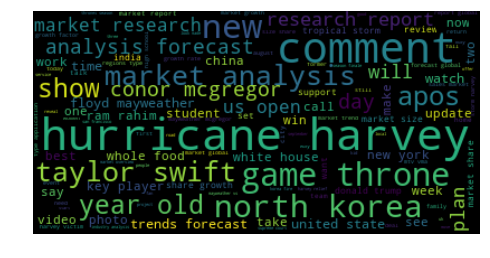

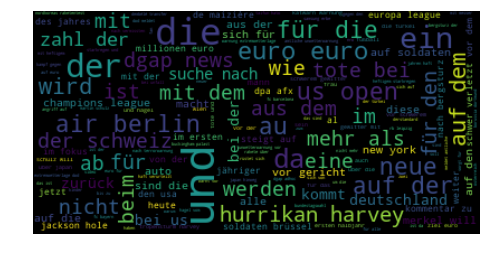

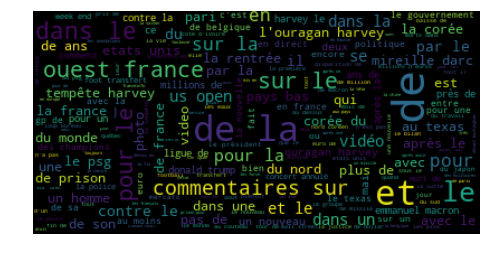

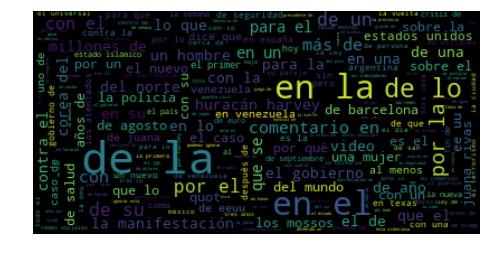

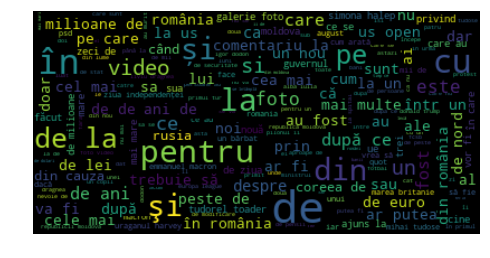

...

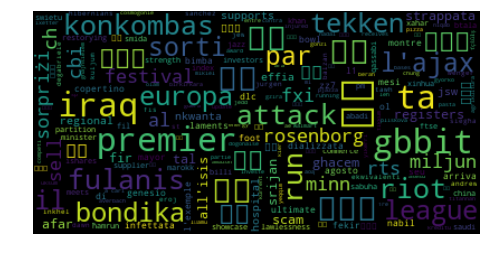

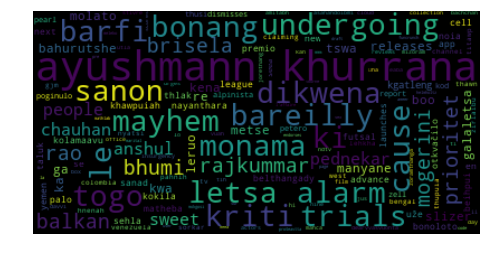

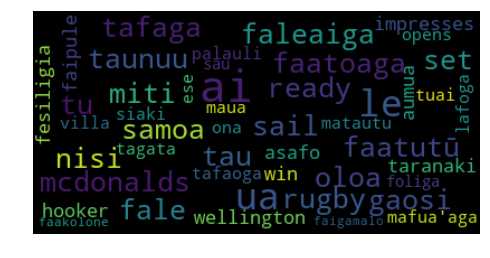

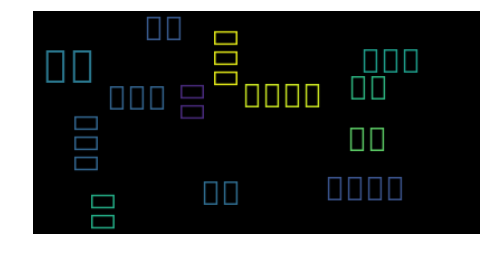

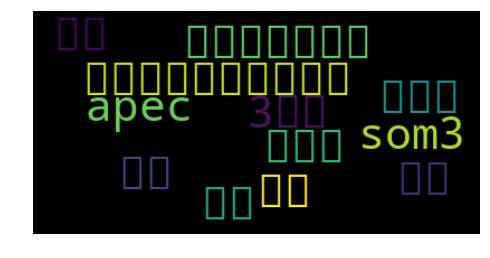

In [78]:
from wordcloud import WordCloud
# total headlines into wordcloud


# language based headlines into wordcloud
for language in words.language.unique():
    # Read the whole text.
    # text = open(path.join(d, 'constitution.txt')).read()
    text = ' '.join(words[words.language == language]['prepped_headlines'])

    # # Generate a word cloud image
    # wordcloud = WordCloud().generate(text)

    # # Display the generated image:
    # # the matplotlib way:
    # plt.imshow(wordcloud, interpolation='bilinear')
    # plt.axis("off")

    # lower max_font_size
    wordcloud = WordCloud(max_font_size=40).generate(text)
    plt.figure(figsize=(8,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    # plt.savefig('Visuals/twitter_cloud.png', dpi=900, bbox_inches='tight'); # , bbox_inches='tight'
    # plt.show()

In [ ]:
# from os import path
from wordcloud import WordCloud

# d = path.dirname(__file__)

# Read the whole text.
# text = open(path.join(d, 'constitution.txt')).read()
text = ' '.join(clean_list)

# # Generate a word cloud image
# wordcloud = WordCloud().generate(text)

# # Display the generated image:
# # the matplotlib way:
# plt.imshow(wordcloud, interpolation='bilinear')
# plt.axis("off")

# lower max_font_size
wordcloud = WordCloud(max_font_size=40).generate(text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
# plt.savefig('Visuals/twitter_cloud.png', dpi=900, bbox_inches='tight'); # , bbox_inches='tight'
# plt.show()

### Word Frequency, by language

In [73]:
# spanish stopwords
# spanish_stopwords = pd.read_csv('https://raw.githubusercontent.com/xiamx/node-nltk-stopwords/master/data/stopwords/spanish', header=None)
# spanish_stopwords_list = [x for x in spanish_stopwords.loc[:,0]]
# with open('spanish_stopwords_list.pkl', 'wb') as f:
#     pickle.dump(spanish_stopwords_list, f)
with open('Data/spanish_stopwords_list.pkl', 'rb') as f:
    pickle.dump(spanish_stopwords_list, f)

In [81]:
# french stopwords
french_stopwords = pd.read_csv('https://raw.githubusercontent.com/stopwords-iso/stopwords-fr/master/stopwords-fr.txt', header=None)
french_stopwords_list = [x for x in french_stopwords.loc[:,0]]
with open('Data/french_stopwords_list.pkl', 'wb') as f:
    pickle.dump(french_stopwords_list, f)

In [91]:
stopword_source_list = [('German', 'http://members.unine.ch/jacques.savoy/clef/germanST.txt'),
                       ('Italian', 'http://members.unine.ch/jacques.savoy/clef/italianST.txt'),
                       ('Spanish', 'http://members.unine.ch/jacques.savoy/clef/spanishSmart.txt'),
                        ('Portuguese', 'http://members.unine.ch/jacques.savoy/clef/portugueseST.txt'),
                        ('Finnish', 'http://members.unine.ch/jacques.savoy/clef/finnishST.txt'),
                        ('Swedish', 'http://members.unine.ch/jacques.savoy/clef/swedishST.txt'),
                        ('Arabic', 'http://members.unine.ch/jacques.savoy/clef/arabicST.txt'),
                        ('Russian', 'http://members.unine.ch/jacques.savoy/clef/russianST.txt'),
                        ('Hungarian', 'http://members.unine.ch/jacques.savoy/clef/hungarianST.txt'),
                        ('Bulgarian', 'http://members.unine.ch/jacques.savoy/clef/bulgarianST.txt'),
                        ('Romanian', 'http://members.unine.ch/jacques.savoy/clef/roumanianST.txt'),
                        ('Czech', 'http://members.unine.ch/jacques.savoy/clef/czechST.txt'),
                        ('Polish', 'http://members.unine.ch/jacques.savoy/clef/polishST.txt'),
                        ('Persian-Farsi', 'http://members.unine.ch/jacques.savoy/clef/persianST.txt'),
                        ('Hindi', 'http://members.unine.ch/jacques.savoy/clef/hindiST.txt'),
                        ('Marathi', 'http://members.unine.ch/jacques.savoy/clef/marathiST.txt'),
                        ('Bengali', 'http://members.unine.ch/jacques.savoy/clef/bengaliST.txt')
                       ]

In [97]:
import pandas as pd
import pickle

def create_stopword_list(language, stopwords_url):
    """
    Requires single column of words as input (from stopwords_url).
    """  
    try:
        stopwords = pd.read_table(stopwords_url, header=None, encoding='latin-1')
        stopwords_list = [x for x in stopwords.loc[:,0]]
        with open('Data/stopwords_list_'+language+'.pkl', 'wb') as f:
            pickle.dump(stopwords_list, f)
    except:
        try:
            stopwords = pd.read_table(stopwords_url, header=None, encoding='utf-8')
            stopwords_list = [x for x in stopwords.loc[:,0]]
            with open('Data/stopwords_list_'+language+'.pkl', 'wb') as f:
                pickle.dump(stopwords_list, f)
        except:
#             failed = language + ' failed attempt'
            pass
    
    return()

for lang, url in stopword_source_list:
    create_stopword_list(lang, url)

In [49]:
from collections import Counter
import operator

word_count_by_lang = []
for language in words.language.unique():
    # Isolate the headlines per language
    temp_token_words = [word_tokenize(word) for word in words[words.language == language]['prepped_headlines']]
    
    # Create a master list of all words in headlines of that language
    temp_word_master = []
    for word in temp_token_words:
        temp_word_master.extend(word)
    
    # Create a counter of the words
    word_counter = Counter(temp_word_master)
    sorted_counter = sorted(word_counter.items(), key=operator.itemgetter(1), reverse=True)
    word_count_by_lang.append(sorted_counter[25:])
    print('{} analysis completed'.format(language))

English analysis completed
German analysis completed
French analysis completed
Spanish; Castilian analysis completed
Romanian; Moldavian; Moldovan analysis completed
Catalan; Valencian analysis completed
Bosnian analysis completed
Russian analysis completed
Croatian analysis completed
Danish analysis completed
Dutch; Flemish analysis completed
Persian analysis completed
Turkish analysis completed
Portuguese analysis completed
Latvian analysis completed
Tamil analysis completed
Arabic analysis completed
Ukrainian analysis completed
Italian analysis completed
Galician analysis completed
Japanese analysis completed
Greek, Modern (1453-) analysis completed
Swedish analysis completed
Norwegian analysis completed
Indonesian analysis completed
Corsican analysis completed
Vietnamese analysis completed
Czech analysis completed
Bulgarian analysis completed
Macedonian analysis completed
Armenian analysis completed
Korean analysis completed
Hindi analysis completed
Finnish analysis completed
Tagal

In [51]:
# with open('Data/language_word_counts.pkl', 'wb') as f:
#     pickle.dump(word_count_by_lang, f)

with open('Data/language_word_counts.pkl', 'rb') as f:
    word_count_by_lang = pickle.load(f)
    
len(word_count_by_lang)

In [54]:
#     top_pairs = {k: x[k] for k in list(x)[:20]}
#     print(top_pairs)

96

### Topic Modeling for Each Language

In [103]:
with open('Data/stopwords_list_Spanish.pkl', 'rb') as f:
    spanish = pickle.load(f)

In [104]:
# only basic term frequency can be considered with LDA because it defines 
# its own PROBABALISTIC determination of topics / grouping / etc.

n_components = 10

tf_vectorizer = CountVectorizer(max_df=0.95, min_df=3,
                                ngram_range=(1,3),
                                max_features=1000,
                                stop_words=spanish)
tf = tf_vectorizer.fit_transform(span.prepped_headlines)   #<<<---- Change this

# define model (lda) and model parameters, fit model to vectorized data
lda = LatentDirichletAllocation(n_components=n_components, max_iter=10,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=42)
lda.fit(tf)

vocab = tf_vectorizer.get_feature_names()

In [105]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx), " ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
#         print (" ".join([feature_names[i]
#                         for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
display_topics(lda, vocab, n_components)

Topic 0: millones caso méxico eeuu año paso joven agua deja vida
Topic 1: años norte corea hombre corea norte nacional seguridad mundo quot 14
Topic 2: 000 policía rajoy muertos crisis euros pareja 16 lluvias 17
Topic 3: venezuela pide chile presidente maduro fotos vuelta coche redes santa
Topic 4: gobierno te denuncia japón mujeres estados 11 unidos 27 estados unidos
Topic 5: harvey españa barcelona texas huracán san estado día huracán harvey manifestación
Topic 6: misil detenido 15 plan noticias congreso niños 21 amenaza brasil
Topic 7: trump 2017 comentario madrid país mujer colombia ley 30 casa
Topic 8: video eng personas argentina diario semana ciudad centro septiembre pp
Topic 9: com 10 china salud 12 perú 13 rusia días menor
